# Total Production Units for Self-Consumption

Master Data Science and Engineering - FEUP

**Group 4**

Beatriz Iara Nunes Silva

Inês Clotilde da Costa Neves

Mariana Rocha Cristino

Patrícia Crespo da Silva

## Methodology of Statistical Research

Based on a given dataset the six-step statistical investigation method will be applied:

1. **(2) Ask a research question**
2. **(1) Design a study and collect data**
3. **Explore the data**
4. **Draw inference**
5. **Formulate conclusions**
6. **Look back and ahead**

---


## Phase 1: Study Design and Data Collection

A research question is posed with a proposed data set: Total Production Units for Self-Consumption.  
The data was collected and provided by **e-Redes – Redes Energéticas Nacionais, S.A.**, the Portuguese  
electricity distribution company responsible for managing and monitoring electricity networks across Portugal.

**Dataset link:** [Total Production Units for Self-Consumption (e-Redes)](https://e-redes.opendatasoft.com/explore/dataset/8-unidades-de-producao-para-autoconsumo/information/)

---

## Phase 2: Research questions

### General Research Question

RQ: Compare how seasonal (winter vs summer), regional, and technical factors shape self-consumption energy production patterns in Portugal between 2023 and 2024.

### Specific Research Questions

• RQ1: Compare the average installed capacity per UPAC across different power levels and municipalities in 2023 and 2024.

• RQ2: Compare the evolution of installed capacity between 2023 and 2024 across residential and industrial UPACs to assess differences in growth patterns.

• RQ3: Compare the total installed capacity for self-consumption across different power scales (installed capacity ranges) and seasons (winter vs. summer) in selected Portuguese districts during 2023 and 2024.

---


### Imports

In [1]:
import geopandas as gpd
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib import patheffects
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## Phase 3: Exploratory Data Analysis

Read the CSV

In [2]:
df = pd.read_csv('../Data/UPAC_Total_Production.csv', sep=';', decimal='.')

### 3.1. Initial Data Overview

First rows of the dataset:

In [3]:
print("First rows of the dataset:")
display(df.head())

First rows of the dataset:


,Quarter,District,Municipality,Parish,Zip Code,Technology Type,Voltage level,Installed power range (kW),Number of installations,Total installed power (kW),DistrictCode,Municipality Code,DistrictMunicipalityParishCode,CPEs (#),relacao_instalacoes_por_cpe,relacao_potencia_por_cpe
0,2023T1,Coimbra,Condeixa-a-Nova,Furadouro,3150,Solar,BTN,"]0, 4]",2,3.00,6,604,060407,9537.0,0.000210,0.000315
1,2023T1,Coimbra,Condeixa-a-Nova,Zambujal,3150,Solar,BTN,"]0, 4]",2,4.32,6,604,060410,9537.0,0.000210,0.000453
2,2023T1,Coimbra,Condeixa-a-Nova,Condeixa-a-Velha e Condeixa-a-Nova,3150,Não Atribuído,BTN,"]0, 4]",1,1.05,6,604,060411,9537.0,0.000105,0.000110
3,2023T1,Coimbra,Condeixa-a-Nova,Vila Seca e Bem da Fé,3150,Solar,BTN,"]0, 4]",17,28.14,6,604,060413,9537.0,0.001783,0.002951
4,2023T1,Coimbra,Figueira da Foz,São Pedro,3090,Não Atribuído,BTN,"]0, 4]",2,3.28,6,605,060514,50436.0,0.000040,0.000065


Dataset info:

In [4]:
print("\nDataset info:")
print(df.info())


Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121294 entries, 0 to 121293
Data columns (total 16 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Quarter                         121294 non-null  object 
 1   District                        121294 non-null  object 
 2   Municipality                    121294 non-null  object 
 3   Parish                          121294 non-null  object 
 4   Zip Code                        121294 non-null  int64  
 5   Technology Type                 121283 non-null  object 
 6   Voltage level                   121292 non-null  object 
 7   Installed power range (kW)      121294 non-null  object 
 8   Number of installations         121294 non-null  int64  
 9   Total installed power (kW)      121294 non-null  float64
 10  DistrictCode                    121294 non-null  int64  
 11  Municipality Code               121294 non-null  int64  
 12  D

Filtering the Dataset by Year (2023–2024)

In [5]:
df = df[df['Quarter'].str.startswith(('2023', '2024'))].copy()
print("\nDataset info:")
print(df.info())



Dataset info:
<class 'pandas.core.frame.DataFrame'>
Index: 88545 entries, 0 to 120858
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Quarter                         88545 non-null  object 
 1   District                        88545 non-null  object 
 2   Municipality                    88545 non-null  object 
 3   Parish                          88545 non-null  object 
 4   Zip Code                        88545 non-null  int64  
 5   Technology Type                 88545 non-null  object 
 6   Voltage level                   88543 non-null  object 
 7   Installed power range (kW)      88545 non-null  object 
 8   Number of installations         88545 non-null  int64  
 9   Total installed power (kW)      88545 non-null  float64
 10  DistrictCode                    88545 non-null  int64  
 11  Municipality Code               88545 non-null  int64  
 12  DistrictMunicipalityP

Missing Values summary:

In [6]:
missing_df = pd.DataFrame({
    'Missing Values': df.isnull().sum(),
    'Percentage': (df.isnull().sum() / len(df)) * 100
})
print("\nMissing Values summary:")
display(missing_df[missing_df['Missing Values'] > 0])


Missing Values summary:


,Missing Values,Percentage
Voltage level,2,0.002259


Summary statistics:

In [7]:
print("\nSummary statistics:")
display(df.describe())


Summary statistics:


,Zip Code,Number of installations,Total installed power (kW),DistrictCode,Municipality Code,CPEs (#),relacao_instalacoes_por_cpe,relacao_potencia_por_cpe
count,88545.000000,88545.000000,88545.000000,88545.000000,88545.000000,88545.000000,88545.000000,88545.000000
mean,4510.469682,17.478085,122.100283,9.463109,954.837732,45250.293229,0.000824,0.005884
std,1662.939788,58.107265,383.688157,5.343929,535.651430,60362.537318,0.002352,0.031134
min,1000.000000,1.000000,0.000000,1.000000,101.000000,1260.000000,0.000003,0.000000
25%,3105.000000,1.000000,14.040000,4.000000,406.000000,10911.000000,0.000036,0.000469
50%,4600.000000,2.000000,30.000000,10.000000,1012.000000,27430.000000,0.000116,0.001443
75%,5160.000000,8.000000,82.790000,14.000000,1401.000000,57414.000000,0.000492,0.004070
max,8970.000000,2118.000000,19600.000000,18.000000,1824.000000,399456.000000,0.052016,3.203661


Number of installations by District:

In [8]:
print("\nNumber of installations by District:")
print(df.groupby('District')['Number of installations'].sum())


Number of installations by District:
District
Aveiro              128364
Beja                 24050
Braga               192514
Bragança             22625
Castelo Branco       35890
Coimbra              82187
Faro                 83619
Guarda               24379
Leiria              102699
Lisboa              182122
Portalegre           17252
Porto               217210
Santarém             98323
Setúbal             149716
Viana do Castelo     43599
Vila Real            38925
Viseu                75512
Évora                28611
Name: Number of installations, dtype: int64


Total installed power (kW) by District:

In [9]:
print("\nTotal installed power (kW) by District:")
print(df.groupby('District')['Total installed power (kW)'].sum())


Total installed power (kW) by District:
District
Aveiro              1338245.52
Beja                 303260.40
Braga               1279839.54
Bragança             106448.67
Castelo Branco       286428.14
Coimbra              555764.84
Faro                 500667.92
Guarda               143244.38
Leiria               951815.03
Lisboa              1237281.72
Portalegre           125099.26
Porto               1570484.48
Santarém             688125.72
Setúbal              629307.56
Viana do Castelo     247010.65
Vila Real            147143.12
Viseu                476273.39
Évora                224929.23
Name: Total installed power (kW), dtype: float64


Number of installations by Technology Type:

In [10]:
print("\nNumber of installations by Technology Type:")
print(df.groupby('Technology Type')['Number of installations'].sum())


Number of installations by Technology Type:
Technology Type
Biogás                          31
Biomassa                         5
Cogeração não renovável          8
Eólica                         100
Fotovoltaica                     4
Hídrica                         10
Não Atribuído                28406
Solar                      1519033
Name: Number of installations, dtype: int64


### 3.2 Data Visualization

1) Histogram of Total Installed Power (kW)
2) Violin Plot of Total Installed Power by Voltage Level
3) Boxplot of Total Installed Power by Technology Type
4) Countplot of Installed Power Ranges
5) Barplot of Number of Installations per District
6) Stacked Barplot of Technology Type Counts per Voltage Level
7) Scatterplot of Number of Installations vs Total Installed Power
8) Lineplot of Total Installed Power by Technology Tyoe Over Time
9) Lineplot by Voltage Level – Total Installed Power per Voltage Level per Quarter
10) Polar Chart for Seasonal Installed Power by Technology Type
11) Plot of Number of Installations and Total Power by District
12) Choropleth Map of Total Installed Power by District
13) Choropleth Map of Number of Installations by District
14) Choropleth Map of Percentage of Total Installed Power per District (2023T1 -> 2024T4)
15) Choropleth Maps of Quarterly Percentage Change of Total Installed Power by District
16) Choropleth Maps of Quarterly Percentage Change of Number of Installations by District
17) Choropleth Maps of Average Installed Power per UPAC

Added another dataset to enable visualization of information on maps.

In [11]:
map = gpd.read_file("../Data/Portugal_Map.gpkg", layer='cont_distritos')

print(map.columns)
print(map.head())

map = map[['distrito', 'geometry']]

Index(['dt', 'distrito', 'nuts1', 'area_ha', 'perimetro_km', 'n_municipios',
       'n_freguesias', 'geometry'],
      dtype='object')
   dt        distrito       nuts1     area_ha  perimetro_km  n_municipios  \
0  01          Aveiro  Continente   280094.16           376            19   
1  02            Beja  Continente  1026332.49           762            14   
2  03           Braga  Continente   270615.05           351            14   
3  04        Bragança  Continente   659853.71           476            12   
4  05  Castelo Branco  Continente   662747.31           569            11   

   n_freguesias                                           geometry  
0         174.0  MULTIPOLYGON (((-44918.396 84539.049, -44943.6...  
1          84.0  MULTIPOLYGON (((21353.196 -247928.768, 21332.9...  
2         371.0  MULTIPOLYGON (((-29173.439 189016.541, -29196....  
3         226.0  MULTIPOLYGON (((87905.57 162924.965, 87847.549...  
4         128.0  MULTIPOLYGON (((36783.65 -3506.686, 3674

#### 3.2.1 Histogram of Total Installed Power (kW)

In [12]:
fig1_low = px.histogram(
    df[df['Total installed power (kW)'] <= 500],
    x='Total installed power (kW)',
    nbins=50,
    color_discrete_sequence=['#0083B8'],
    marginal='box',
    title='Distribution of Total Installed Power (≤500 kW)'
)
fig1_low.update_layout(
    template='plotly_white',
    xaxis_title='Total Installed Power (kW)',
    yaxis_title='Count',
    title_x=0.5,
    bargap=0.05,
)
fig1_low.show()

fig1_medium = px.histogram(
    df[(df['Total installed power (kW)'] > 500) & (df['Total installed power (kW)'] <= 1000)],
    x='Total installed power (kW)',
    nbins=50,
    color_discrete_sequence=['#0083B8'],
    marginal='box',
    title='Distribution of Total Installed Power (500 < Power ≤ 1000 kW)'
)
fig1_medium.update_layout(
    template='plotly_white',
    xaxis_title='Total Installed Power (kW)',
    yaxis_title='Count',
    title_x=0.5,
    bargap=0.05,
)
fig1_medium.show()

fig1_high = px.histogram(
    df[df['Total installed power (kW)'] > 1000],
    x='Total installed power (kW)',
    nbins=50,
    color_discrete_sequence=['#0083B8'],
    marginal='box',
    title='Distribution of Total Installed Power (>1000 kW)'
)
fig1_high.update_layout(
    template='plotly_white',
    xaxis_title='Total Installed Power (kW)',
    yaxis_title='Count',
    title_x=0.5,
    bargap=0.05,
)
fig1_high.show()

#### 3.2.2 Violin Plot of Total Installed Power by Voltage Level

In [13]:
voltage_levels = df['Voltage level'].unique()

fig2 = make_subplots(
    rows=1, cols=len(voltage_levels),
    shared_yaxes=False,
    subplot_titles=voltage_levels
)

for i, voltage in enumerate(voltage_levels, start=1):
    df_voltage = df[df['Voltage level'] == voltage]
    fig2.add_trace(
        go.Box(
            y=df_voltage['Total installed power (kW)'],
            name=voltage,
            boxpoints='all',
            marker_color=px.colors.qualitative.Vivid[i % len(px.colors.qualitative.Vivid)],
            line=dict(width=0),
            fillcolor='rgba(0,0,0,0)'
        ),
        row=1, col=i
    )

fig2.update_layout(
    template='plotly_white',
    title='Total Installed Power by Voltage Level',
    title_x=0.5,
    showlegend=False,
    height=500,
    width=300*len(voltage_levels)
)
fig2.show()

#### 3.2.3 Boxplot of Total Installed Power by Technology Type

In [14]:
fig3 = px.box(
    df,
    x='Technology Type',
    y='Total installed power (kW)',
    color='Technology Type',
    color_discrete_sequence=px.colors.qualitative.Safe,
    title='Boxplot: Total Installed Power by Technology Type',
)
fig3.update_layout(
    template='plotly_white',
    xaxis_title='Technology Type',
    yaxis_title='Total Installed Power (kW)',
    title_x=0.5,
)
fig3.show()

#### 3.2.4 Countplot of Installed Power Ranges

In [15]:
power_range_counts = df['Installed power range (kW)'].value_counts().reset_index()
power_range_counts.columns = ['Installed power range (kW)', 'Count']

fig4 = px.bar(
    power_range_counts,
    x='Installed power range (kW)',
    y='Count',
    color='Installed power range (kW)',
    title='Countplot of Installed Power Ranges',
    color_discrete_sequence=px.colors.qualitative.Bold,
    text='Count'
)
fig4.update_traces(textposition='outside')
fig4.update_layout(
    template='plotly_white',
    xaxis_title='Installed Power Range (kW)',
    yaxis_title='Number of Records',
    title_x=0.5
)
fig4.show()

#### 3.2.5 Barplot of Number of Installations per District

In [16]:
installs_per_district = (
    df.groupby('District', as_index=False)['Number of installations'].sum()
    .sort_values(by='Number of installations', ascending=False)
)

fig5 = px.bar(
    installs_per_district,
    x='District',
    y='Number of installations',
    color='District',
    color_discrete_sequence=px.colors.qualitative.Safe,
    title='Number of Installations per District',
    text='Number of installations'
)
fig5.update_traces(textposition='outside')
fig5.update_layout(
    template='plotly_white',
    xaxis_title='District',
    yaxis_title='Total Number of Installations',
    title_x=0.5,
    showlegend=False,
)
fig5.show()

#### 3.2.6 Stacked Barplot of Technology Type Counts per Voltage Level

In [17]:
dominant_techs = ['Solar', 'Não Atribuído']
df_dominant = df[df['Technology Type'].isin(dominant_techs)].copy()
df_others = df[~df['Technology Type'].isin(dominant_techs)].copy()

color_map = px.colors.qualitative.Vivid
color_dict = {tech: color_map[i % len(color_map)] for i, tech in enumerate(df['Technology Type'].unique())}

tech_counts = df.groupby(['Voltage level','Technology Type']).size().reset_index(name='Count')
dominant_df = tech_counts[tech_counts['Technology Type'].isin(dominant_techs)].copy()
others_df = tech_counts[~tech_counts['Technology Type'].isin(dominant_techs)].copy()

num_levels = df['Voltage level'].nunique()
fig_height = max(450, num_levels*60)

fig6 = make_subplots(
    rows=1, cols=2,
    shared_yaxes=True,
    column_widths=[0.6, 0.4],
    horizontal_spacing=0.05,
    subplot_titles=("Solar & Não Atribuído", "Other Technologies")
)

for tech in dominant_techs:
    data = dominant_df[dominant_df['Technology Type'] == tech]
    fig6.add_trace(
        go.Bar(
            y=data['Voltage level'],
            x=data['Count'],
            name=tech,
            text=data['Count'],
            textposition='inside',
            orientation='h',
            marker=dict(color=color_dict[tech], line=dict(width=0.8, color='rgba(0,0,0,0.2)')),
            hovertemplate="<b>Technology:</b> %{name}<br><b>Voltage Level:</b> %{y}<br><b>Installations:</b> %{x}<extra></extra>"
        ),
        row=1, col=1
    )

for tech in sorted(others_df['Technology Type'].unique()):
    data = others_df[others_df['Technology Type'] == tech]
    fig6.add_trace(
        go.Bar(
            y=data['Voltage level'],
            x=data['Count'],
            name=tech,
            text=data['Count'],
            textposition='inside',
            orientation='h',
            marker=dict(color=color_dict[tech], line=dict(width=0.8, color='rgba(0,0,0,0.2)')),
            hovertemplate="<b>Technology:</b> %{name}<br><b>Voltage Level:</b> %{y}<br><b>Installations:</b> %{x}<extra></extra>"
        ),
        row=1, col=2
    )

fig6.update_layout(
    template='plotly_white',
    title="<b>Installations by Voltage Level and Technology Type</b>",
    barmode='stack',
    width=1300,
    height=fig_height,
    legend_title="<b>Technology Type</b>",
    margin=dict(l=120, r=60, t=90, b=60)
)
fig6.update_xaxes(title_text='Number of Installations', row=1, col=1)
fig6.update_xaxes(title_text='Number of Installations', row=1, col=2)
fig6.update_yaxes(title_text='Voltage Level', row=1, col=1)
fig6.update_yaxes(showticklabels=False, row=1, col=2)

fig6.show()


#### 3.2.7 Scatterplot of Number of Installations vs Total Installed Power

In [18]:
fig7 = make_subplots(
    rows=1, cols=2,
    subplot_titles=['Solar & Não Atribuído', 'Other Technologies'],
    shared_yaxes=True,
    horizontal_spacing=0.07
)

for tech in dominant_techs:
    data = df_dominant[df_dominant['Technology Type'] == tech]
    fig7.add_trace(
        go.Scatter(
            x=data['Number of installations'],
            y=data['Total installed power (kW)'],
            mode='markers',
            name=tech,
            legendgroup=tech,
            marker=dict(
                size=9,
                color=color_dict[tech],
                opacity=0.75,
                line=dict(width=0.7, color='rgba(0,0,0,0.2)')
            ),
            customdata=data[['Technology Type','District','Municipality']],
            hovertemplate=(
                "<b>Technology:</b> %{customdata[0]}<br>"
                "<b>Installations:</b> %{x}<br>"
                "<b>Total Power (kW):</b> %{y}<br>"
                "<b>District:</b> %{customdata[1]}<br>"
                "<b>Municipality:</b> %{customdata[2]}<extra></extra>"
            )
        ),
        row=1, col=1
    )

for tech in sorted(df_others['Technology Type'].unique()):
    data = df_others[df_others['Technology Type'] == tech]
    fig7.add_trace(
        go.Scatter(
            x=data['Number of installations'],
            y=data['Total installed power (kW)'],
            mode='markers',
            name=tech,
            legendgroup=tech,
            marker=dict(
                size=8,
                color=color_dict[tech],
                opacity=0.8,
                line=dict(width=0.5, color='rgba(0,0,0,0.2)')
            ),
            customdata=data[['Technology Type','District','Municipality']],
            hovertemplate=(
                "<b>Technology:</b> %{customdata[0]}<br>"
                "<b>Installations:</b> %{x}<br>"
                "<b>Total Power (kW):</b> %{y}<br>"
                "<b>District:</b> %{customdata[1]}<br>"
                "<b>Municipality:</b> %{customdata[2]}<extra></extra>"
            )
        ),
        row=1, col=2
    )

fig7.update_layout(
    template='plotly_white',
    title="<b>Scatterplot: Number of Installations vs Total Installed Power</b>",
    title_x=0.5,
    height=650,
    width=1400,
    legend_title="<b>Technology Type</b>",
    barmode='stack'
)

fig7.update_xaxes(title_text='Number of Installations (log scale)', type='log', row=1, col=1)
fig7.update_xaxes(title_text='Number of Installations (log scale)', type='log', row=1, col=2)
fig7.update_yaxes(title_text='Total Installed Power (kW, log scale)', type='log', row=1, col=1)
fig7.update_yaxes(showticklabels=False, type='log', row=1, col=2)
fig7.show()

#### 3.2.8 Total Installed Power by Technology Type Over Time

In [19]:
dominant_techs = ['Solar', 'Não Atribuído']
df_time = df.groupby(['Quarter', 'Technology Type'], as_index=False)['Total installed power (kW)'].sum()
df_dom = df_time[df_time['Technology Type'].isin(dominant_techs)]
df_others = df_time[~df_time['Technology Type'].isin(dominant_techs)]


fig8 = make_subplots(
    rows=1, cols=2,
    subplot_titles=['Solar & Não Atribuído', 'Other Technologies'],
    shared_yaxes=False
)

for tech in dominant_techs:
    data = df_dom[df_dom['Technology Type'] == tech]
    fig8.add_trace(
        go.Scatter(
            x=data['Quarter'],
            y=data['Total installed power (kW)'],
            mode='lines+markers',
            name=tech
        ),
        row=1, col=1
    )

for tech in df_others['Technology Type'].unique():
    data = df_others[df_others['Technology Type'] == tech]
    fig8.add_trace(
        go.Scatter(
            x=data['Quarter'],
            y=data['Total installed power (kW)'],
            mode='lines+markers',
            name=tech
        ),
        row=1, col=2
    )

fig8.update_layout(
    template='plotly_white',
    title='Total Installed Power by Technology Type Over Time',
    title_x=0.5,
    height=600,
    width=1200
)
fig8.show()

#### 3.2.9 Lineplot by Voltage Level – Total Installed Power per Voltage Level per Quarter

In [20]:
df_time = df.groupby(['Quarter', 'Voltage level'], as_index=False)['Total installed power (kW)'].sum()
df_voltage = df_time.groupby(['Quarter','Voltage level'])['Total installed power (kW)'].sum().reset_index()

fig9 = px.line(
    df_voltage,
    x='Quarter',
    y='Total installed power (kW)',
    color='Voltage level',
    facet_col='Voltage level',
    title='Total Installed Power per Voltage Level per Quarter',
    markers=True
)

fig9.update_layout(template='plotly_white', title_x=0.5, showlegend=False)
fig9.show()


#### 3.2.10 Polar Chart for Seasonal Installed Power by Technology Type

In [21]:
df_polar_agg = df.groupby(['Quarter', 'Technology Type'])['Total installed power (kW)'].sum().reset_index()

tech_list = sorted(df_polar_agg['Technology Type'].unique())
color_map = px.colors.qualitative.Vivid
color_dict = {tech: color_map[i % len(color_map)] for i, tech in enumerate(tech_list)}

df_polar_solar = df_polar_agg[df_polar_agg['Technology Type'] == 'Solar']
df_polar_na = df_polar_agg[df_polar_agg['Technology Type'] == 'Não Atribuído']
df_polar_others = df_polar_agg[~df_polar_agg['Technology Type'].isin(['Solar', 'Não Atribuído'])]

fig10 = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'polar'}, {'type': 'polar'}, {'type': 'polar'}]],
    subplot_titles=['Solar', 'Não Atribuído', 'Other Technologies']
)

def add_polar_traces(df, col):
    for tech in df['Technology Type'].unique():
        data = df[df['Technology Type'] == tech]
        fig10.add_trace(
            go.Scatterpolar(
                r=data['Total installed power (kW)'],
                theta=data['Quarter'],
                name=tech,
                fill='toself',
                opacity=0.7,
                line=dict(color=color_dict[tech], width=2),
                marker=dict(color=color_dict[tech]),
                hovertemplate=(
                    f"<b>{tech}</b><br>"
                    "Quarter: %{theta}<br>"
                    "Total Power: %{r:.0f} kW<extra></extra>"
                )
            ),
            row=1, col=col
        )

add_polar_traces(df_polar_solar, 1)
add_polar_traces(df_polar_na, 2)
add_polar_traces(df_polar_others, 3)

fig10.update_layout(
    title_text='Seasonal Installed Power by Technology Type',
    template='plotly_white',
    title_x=0.5,
    showlegend=True,
    height=650,
    width=1250,
    polar=dict(
        radialaxis=dict(showgrid=True, gridcolor='lightgray', linecolor='gray'),
        angularaxis=dict(showgrid=True, gridcolor='lightgray')
    ),
    legend=dict(
        orientation='h',
        yanchor='top',
        y=-0.25,
        xanchor='center',
        x=0.5,
        bgcolor='rgba(255,255,255,0.7)',
        bordercolor='lightgray',
        borderwidth=1,
        font=dict(size=10)
    ),
    margin=dict(t=100, b=100, l=40, r=40)
)
fig10.show()

#### 3.2.11 Plot of Number of Installations and Total Power by District

In [22]:
df_dual = df.groupby('District')[['Number of installations', 'Total installed power (kW)']].sum().reset_index()

fig11 = make_subplots(specs=[[{"secondary_y": True}]])

fig11.add_trace(
    go.Bar(
        x=df_dual['District'],
        y=df_dual['Number of installations'],
        name='Number of Installations',
        marker_color='steelblue',
        text=df_dual['Number of installations'],
        textposition='outside',
        textfont=dict(color='steelblue')
    ),
    secondary_y=False
)

fig11.add_trace(
    go.Scatter(
        x=df_dual['District'],
        y=df_dual['Total installed power (kW)'],
        name='Total Installed Power (kW)',
        marker_color='cyan',
        mode='lines+markers+text',
        text=df_dual['Total installed power (kW)'].round(0).astype(int),
        textposition='bottom center',
        textfont=dict(color='cyan')
    ),
    secondary_y=True
)

fig11.update_layout(
    title='Number of Installations and Total Installed Power by District',
    template='plotly_white',
    title_x=0.5
)
fig11.update_xaxes(title_text='District')
fig11.update_yaxes(title_text='Number of Installations', secondary_y=False)
fig11.update_yaxes(title_text='Total Installed Power (kW)', secondary_y=True)

fig11.show()


#### 3.2.12 Choropleth Map of Total Installed Power by District

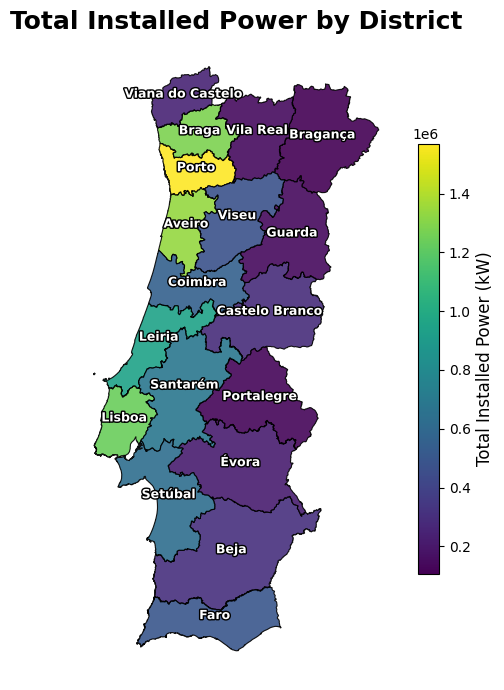

In [23]:
df_grouped = df.groupby('District')['Total installed power (kW)'].sum().reset_index()

map12_merged = map.merge(df_grouped, left_on='distrito', right_on='District', how='left')

fig, ax = plt.subplots(1, 1, figsize=(7, 7))

cmap = plt.cm.viridis
norm = mcolors.Normalize(vmin=map12_merged['Total installed power (kW)'].min(),
                         vmax=map12_merged['Total installed power (kW)'].max())

map12_merged.plot(column='Total installed power (kW)',
                 cmap=cmap,
                 linewidth=0.8,
                 edgecolor='black',
                 ax=ax,
                 alpha=0.9)

for idx, row in map12_merged.iterrows():
    if row['geometry'].geom_type == 'MultiPolygon':
        x, y = row['geometry'].centroid.coords[0]
    else:
        x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
    ax.text(x, y, row['distrito'],
            horizontalalignment='center',
            fontsize=9,
            fontweight='bold',
            color='white',
            path_effects=[patheffects.withStroke(linewidth=2, foreground="black")])

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.set_label('Total Installed Power (kW)', fontsize=12)

ax.set_title('Total Installed Power by District', fontsize=18, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()


#### 3.2.13 Choropleth Map of Number of Installations by District

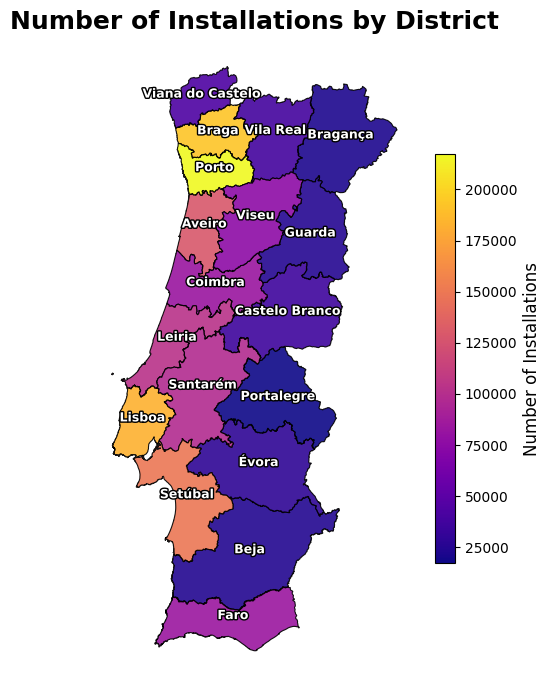

In [24]:
district_installations = df.groupby('District')['Number of installations'].sum().reset_index()

map13_merged = map.merge(district_installations, left_on='distrito', right_on='District', how='left')

fig, ax = plt.subplots(1, 1, figsize=(7, 7))

cmap = plt.cm.plasma
norm = mcolors.Normalize(vmin=map13_merged['Number of installations'].min(),
                         vmax=map13_merged['Number of installations'].max())

map13_merged.plot(column='Number of installations',
               cmap=cmap,
               linewidth=0.8,
               edgecolor='black',
               ax=ax,
               alpha=0.9)

for idx, row in map13_merged.iterrows():
    if row['geometry'].geom_type == 'MultiPolygon':
        x, y = row['geometry'].centroid.coords[0]
    else:
        x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
    ax.text(x, y, row['distrito'],
            horizontalalignment='center',
            fontsize=9,
            fontweight='bold',
            color='white',
            path_effects=[patheffects.withStroke(linewidth=2, foreground="black")])

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.set_label('Number of Installations', fontsize=12)

ax.set_title('Number of Installations by District', fontsize=18, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()


#### 3.2.14 Choropleth Map of Percentage of Total Installed Power per District (2023T1 -> 2024T4)

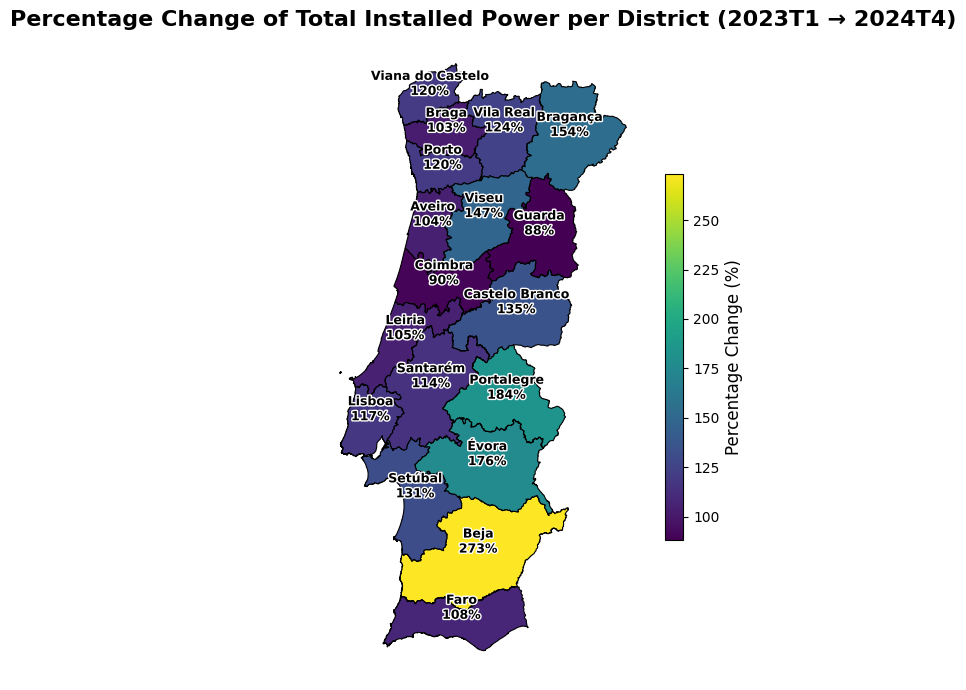

In [25]:
df_start = df[df['Quarter'] == '2023T1'].groupby('District')['Total installed power (kW)'].sum()
df_end   = df[df['Quarter'] == '2024T4'].groupby('District')['Total installed power (kW)'].sum()

df_growth = ((df_end - df_start) / df_start * 100).reset_index()
df_growth.columns = ['District', 'Perc_Change']

map14_merged = map.merge(df_growth, left_on='distrito', right_on='District', how='left')

vmin, vmax = df_growth['Perc_Change'].min(), df_growth['Perc_Change'].max()
norm = Normalize(vmin=vmin, vmax=vmax)
cmap = plt.cm.viridis
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

fig, ax = plt.subplots(1, 1, figsize=(7, 7))
map14_merged.plot(ax=ax,
                 color=map14_merged['Perc_Change'].apply(lambda x: cmap(norm(x))),
                 edgecolor='black',
                 linewidth=0.8)

for idx, row in map14_merged.iterrows():
    if row['geometry'].geom_type == 'MultiPolygon':
        x, y = row['geometry'].centroid.coords[0]
    else:
        x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
    label_text = f"{row['distrito']}\n{row['Perc_Change']:.0f}%"
    ax.text(x, y, label_text, ha='center', fontsize=9, fontweight='bold',
            color='black', path_effects=[patheffects.withStroke(linewidth=2, foreground="white")])

cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label('Percentage Change (%)', fontsize=12)

ax.set_title('Percentage Change of Total Installed Power per District (2023T1 → 2024T4)',
             fontsize=16, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()


#### 3.2.15 Choropleth Maps of Quarterly Percentage Change of Total Installed Power by District

/tmp/ipykernel_336000/4248109365.py:65: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



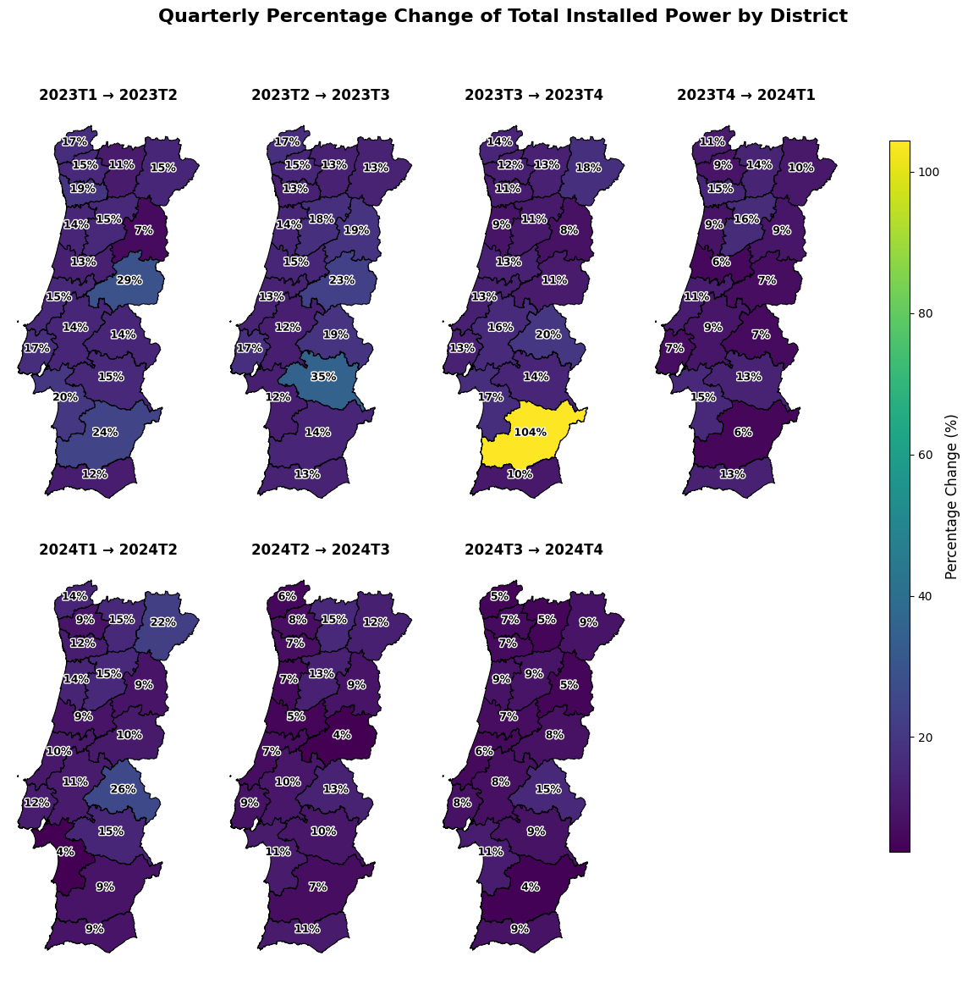

In [26]:
quarters = sorted(df['Quarter'].unique())
num_quarters = len(quarters) - 1

all_changes = []
for i in range(num_quarters):
    start = df[df['Quarter'] == quarters[i]].groupby('District')['Total installed power (kW)'].sum()
    end   = df[df['Quarter'] == quarters[i+1]].groupby('District')['Total installed power (kW)'].sum()
    change = ((end - start)/start * 100).reset_index()
    all_changes.append(change)
combined_changes = pd.concat(all_changes)
vmin, vmax = combined_changes['Total installed power (kW)'].min(), combined_changes['Total installed power (kW)'].max()

norm = Normalize(vmin=vmin, vmax=vmax)
cmap = plt.cm.viridis
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

ncols = 4
nrows = (num_quarters + ncols - 1) // ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 6*nrows))
axes = axes.flatten()

for i in range(num_quarters):
    start_q, end_q = quarters[i], quarters[i+1]

    df_start = df[df['Quarter'] == start_q].groupby('District')['Total installed power (kW)'].sum()
    df_end   = df[df['Quarter'] == end_q].groupby('District')['Total installed power (kW)'].sum()
    df_growth = ((df_end - df_start)/df_start * 100).reset_index()
    df_growth.columns = ['District', 'Perc_Change']

    map_growth = map.merge(df_growth, left_on='distrito', right_on='District', how='left')

    ax = axes[i]
    map_growth.plot(
        ax=ax,
        color=map_growth['Perc_Change'].apply(lambda x: cmap(norm(x))),
        edgecolor='black',
        linewidth=0.8
    )

    for idx, row in map_growth.iterrows():
        if row['geometry'].geom_type == 'MultiPolygon':
            x, y = row['geometry'].centroid.coords[0]
        else:
            x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
        if pd.notnull(row['Perc_Change']):
            label_text = f"{row['Perc_Change']:.0f}%"
            ax.text(
                x, y, label_text, ha='center', fontsize=9, fontweight='bold',
                color='black', path_effects=[patheffects.withStroke(linewidth=2, foreground="white")]
            )

    ax.set_title(f"{start_q} → {end_q}", fontsize=12, fontweight='bold')
    ax.axis('off')

for j in range(num_quarters, len(axes)):
    axes[j].axis('off')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Percentage Change (%)', fontsize=12)

fig.suptitle('Quarterly Percentage Change of Total Installed Power by District', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0,0,0.85,0.95])
plt.show()


#### 3.2.16 Choropleth Maps of Quarterly Percentage Change of Number of Installations by District

/tmp/ipykernel_336000/278273880.py:66: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



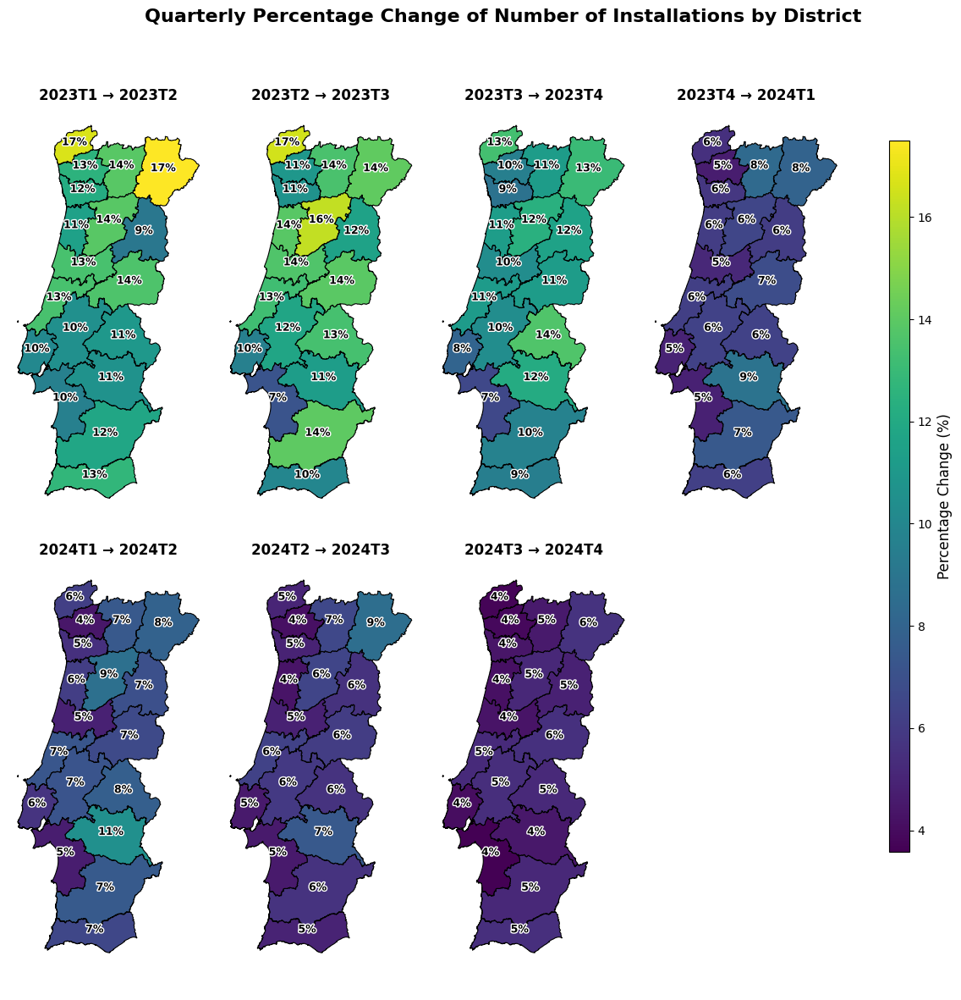

In [27]:
quarters = sorted(df['Quarter'].unique())
num_quarters = len(quarters) - 1

all_changes = []
for i in range(num_quarters):
    start = df[df['Quarter'] == quarters[i]].groupby('District')['Number of installations'].sum()
    end   = df[df['Quarter'] == quarters[i+1]].groupby('District')['Number of installations'].sum()
    change = ((end - start)/start * 100).reset_index()
    all_changes.append(change)

combined_changes = pd.concat(all_changes)
vmin, vmax = combined_changes['Number of installations'].min(), combined_changes['Number of installations'].max()

norm = Normalize(vmin=vmin, vmax=vmax)
cmap = plt.cm.viridis
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

ncols = 4
nrows = (num_quarters + ncols - 1) // ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 6*nrows))
axes = axes.flatten()

for i in range(num_quarters):
    start_q, end_q = quarters[i], quarters[i+1]

    df_start = df[df['Quarter'] == start_q].groupby('District')['Number of installations'].sum()
    df_end   = df[df['Quarter'] == end_q].groupby('District')['Number of installations'].sum()
    df_growth = ((df_end - df_start)/df_start * 100).reset_index()
    df_growth.columns = ['District', 'Perc_Change']

    map_growth = map.merge(df_growth, left_on='distrito', right_on='District', how='left')

    ax = axes[i]
    map_growth.plot(
        ax=ax,
        color=map_growth['Perc_Change'].apply(lambda x: cmap(norm(x))),
        edgecolor='black',
        linewidth=0.8
    )

    for idx, row in map_growth.iterrows():
        if row['geometry'].geom_type == 'MultiPolygon':
            x, y = row['geometry'].centroid.coords[0]
        else:
            x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
        if pd.notnull(row['Perc_Change']):
            label_text = f"{row['Perc_Change']:.0f}%"
            ax.text(
                x, y, label_text, ha='center', fontsize=9, fontweight='bold',
                color='black', path_effects=[patheffects.withStroke(linewidth=2, foreground="white")]
            )

    ax.set_title(f"{start_q} → {end_q}", fontsize=12, fontweight='bold')
    ax.axis('off')

for j in range(num_quarters, len(axes)):
    axes[j].axis('off')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Percentage Change (%)', fontsize=12)

fig.suptitle('Quarterly Percentage Change of Number of Installations by District', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0,0,0.85,0.95])
plt.show()


#### 3.2.17 Choropleth Maps of Average Installed Power per UPAC

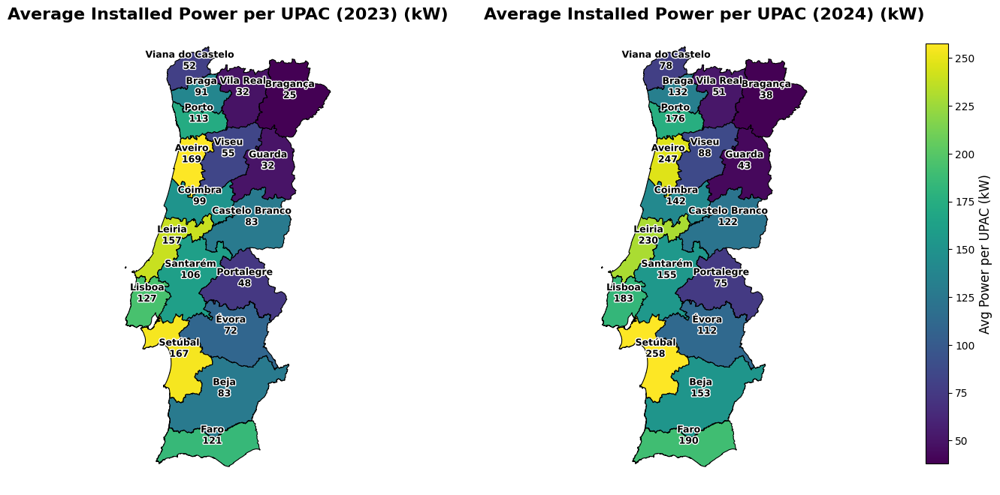

In [28]:
years = [2023, 2024]
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
for idx, year in enumerate(years):
    df_year = df[df['Quarter'].str.startswith(str(year))]
    avg_per_upac = df_year.groupby('District')['Total installed power (kW)'].mean().reset_index()
    avg_per_upac.columns = ['District', 'Avg_Power_per_UPAC']
    mapa_avg = map.merge(avg_per_upac, left_on='distrito', right_on='District', how='left')

    cmap_obj = plt.get_cmap('viridis')
    vmin = mapa_avg['Avg_Power_per_UPAC'].min()
    vmax = mapa_avg['Avg_Power_per_UPAC'].max()
    norm = Normalize(vmin=vmin, vmax=vmax)
    sm = ScalarMappable(cmap=cmap_obj, norm=norm)
    sm.set_array([])

    mapa_avg.plot(
        ax=axes[idx],
        color=mapa_avg['Avg_Power_per_UPAC'].apply(lambda x: cmap_obj(norm(x))),
        edgecolor='black',
        linewidth=0.8
    )

    for i, row in mapa_avg.iterrows():
        if pd.notnull(row['Avg_Power_per_UPAC']):
            if row['geometry'].geom_type == 'MultiPolygon':
                x, y = row['geometry'].centroid.coords[0]
            else:
                x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
            axes[idx].text(
                x, y, f"{row['distrito']}\n{row['Avg_Power_per_UPAC']:.0f}", ha='center', fontsize=9,
                fontweight='bold', color='black',
                path_effects=[patheffects.withStroke(linewidth=2, foreground="white")]
            )

    axes[idx].set_title(f'Average Installed Power per UPAC ({year}) (kW)', fontsize=16, fontweight='bold')
    axes[idx].axis('off')

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Avg Power per UPAC (kW)', fontsize=12)
plt.show()


## <a id="phase4"></a>Phase 4: Draw inference
## <a id="phase5"></a>Phase 5: Formulate conclusions
## <a id="phase6"></a>Phase 6: Look back and ahead
